In [1]:

# imports
import os
import sys
import types
import json
import base64

# figure size/format
fig_width = 5.5
fig_height = 3.5
fig_format = 'pdf'
fig_dpi = 300
interactivity = ''
is_shiny = False
is_dashboard = False
plotly_connected = True

# matplotlib defaults / format
try:
  import matplotlib.pyplot as plt
  plt.rcParams['figure.figsize'] = (fig_width, fig_height)
  plt.rcParams['figure.dpi'] = fig_dpi
  plt.rcParams['savefig.dpi'] = "figure"
  from IPython.display import set_matplotlib_formats
  set_matplotlib_formats(fig_format)
except Exception:
  pass

# plotly use connected mode
try:
  import plotly.io as pio
  if plotly_connected:
    pio.renderers.default = "notebook_connected"
  else:
    pio.renderers.default = "notebook"
  for template in pio.templates.keys():
    pio.templates[template].layout.margin = dict(t=30,r=0,b=0,l=0)
except Exception:
  pass

# disable itables paging for dashboards
if is_dashboard:
  try:
    from itables import options
    options.dom = 'fiBrtlp'
    options.maxBytes = 1024 * 1024
    options.language = dict(info = "Showing _TOTAL_ entries")
    options.classes = "display nowrap compact"
    options.paging = False
    options.searching = True
    options.ordering = True
    options.info = True
    options.lengthChange = False
    options.autoWidth = False
    options.responsive = True
    options.keys = True
    options.buttons = []
  except Exception:
    pass
  
  try:
    import altair as alt
    # By default, dashboards will have container sized
    # vega visualizations which allows them to flow reasonably
    theme_sentinel = '_quarto-dashboard-internal'
    def make_theme(name):
        nonTheme = alt.themes._plugins[name]    
        def patch_theme(*args, **kwargs):
            existingTheme = nonTheme()
            if 'height' not in existingTheme:
              existingTheme['height'] = 'container'
            if 'width' not in existingTheme:
              existingTheme['width'] = 'container'

            if 'config' not in existingTheme:
              existingTheme['config'] = dict()
            
            # Configure the default font sizes
            title_font_size = 15
            header_font_size = 13
            axis_font_size = 12
            legend_font_size = 12
            mark_font_size = 12
            tooltip = False

            config = existingTheme['config']

            # The Axis
            if 'axis' not in config:
              config['axis'] = dict()
            axis = config['axis']
            if 'labelFontSize' not in axis:
              axis['labelFontSize'] = axis_font_size
            if 'titleFontSize' not in axis:
              axis['titleFontSize'] = axis_font_size  

            # The legend
            if 'legend' not in config:
              config['legend'] = dict()
            legend = config['legend']
            if 'labelFontSize' not in legend:
              legend['labelFontSize'] = legend_font_size
            if 'titleFontSize' not in legend:
              legend['titleFontSize'] = legend_font_size  

            # The header
            if 'header' not in config:
              config['header'] = dict()
            header = config['header']
            if 'labelFontSize' not in header:
              header['labelFontSize'] = header_font_size
            if 'titleFontSize' not in header:
              header['titleFontSize'] = header_font_size    

            # Title
            if 'title' not in config:
              config['title'] = dict()
            title = config['title']
            if 'fontSize' not in title:
              title['fontSize'] = title_font_size

            # Marks
            if 'mark' not in config:
              config['mark'] = dict()
            mark = config['mark']
            if 'fontSize' not in mark:
              mark['fontSize'] = mark_font_size

            # Mark tooltips
            if tooltip and 'tooltip' not in mark:
              mark['tooltip'] = dict(content="encoding")

            return existingTheme
            
        return patch_theme

    # We can only do this once per session
    if theme_sentinel not in alt.themes.names():
      for name in alt.themes.names():
        alt.themes.register(name, make_theme(name))
      
      # register a sentinel theme so we only do this once
      alt.themes.register(theme_sentinel, make_theme('default'))
      alt.themes.enable('default')

  except Exception:
    pass

# enable pandas latex repr when targeting pdfs
try:
  import pandas as pd
  if fig_format == 'pdf':
    pd.set_option('display.latex.repr', True)
except Exception:
  pass

# interactivity
if interactivity:
  from IPython.core.interactiveshell import InteractiveShell
  InteractiveShell.ast_node_interactivity = interactivity

# NOTE: the kernel_deps code is repeated in the cleanup.py file
# (we can't easily share this code b/c of the way it is run).
# If you edit this code also edit the same code in cleanup.py!

# output kernel dependencies
kernel_deps = dict()
for module in list(sys.modules.values()):
  # Some modules play games with sys.modules (e.g. email/__init__.py
  # in the standard library), and occasionally this can cause strange
  # failures in getattr.  Just ignore anything that's not an ordinary
  # module.
  if not isinstance(module, types.ModuleType):
    continue
  path = getattr(module, "__file__", None)
  if not path:
    continue
  if path.endswith(".pyc") or path.endswith(".pyo"):
    path = path[:-1]
  if not os.path.exists(path):
    continue
  kernel_deps[path] = os.stat(path).st_mtime
print(json.dumps(kernel_deps))

# set run_path if requested
run_path = 'L2hvbWUvc295YmVhbjQ0L2NvZGUvcHl0aG9uL2NvbXB1dGF0aW9uYWxfcGh5cy93YXZlX2VxdWF0aW9u'
if run_path:
  # hex-decode the path
  run_path = base64.b64decode(run_path.encode("utf-8")).decode("utf-8")
  os.chdir(run_path)

# reset state
%reset

# shiny
# Checking for shiny by using False directly because we're after the %reset. We don't want
# to set a variable that stays in global scope.
if False:
  try:
    import htmltools as _htmltools
    import ast as _ast

    _htmltools.html_dependency_render_mode = "json"

    # This decorator will be added to all function definitions
    def _display_if_has_repr_html(x):
      try:
        # IPython 7.14 preferred import
        from IPython.display import display, HTML
      except:
        from IPython.core.display import display, HTML

      if hasattr(x, '_repr_html_'):
        display(HTML(x._repr_html_()))
      return x

    # ideally we would undo the call to ast_transformers.append
    # at the end of this block whenver an error occurs, we do 
    # this for now as it will only be a problem if the user 
    # switches from shiny to not-shiny mode (and even then likely
    # won't matter)
    import builtins
    builtins._display_if_has_repr_html = _display_if_has_repr_html

    class _FunctionDefReprHtml(_ast.NodeTransformer):
      def visit_FunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

      def visit_AsyncFunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

    ip = get_ipython()
    ip.ast_transformers.append(_FunctionDefReprHtml())

  except:
    pass

def ojs_define(**kwargs):
  import json
  try:
    # IPython 7.14 preferred import
    from IPython.display import display, HTML
  except:
    from IPython.core.display import display, HTML

  # do some minor magic for convenience when handling pandas
  # dataframes
  def convert(v):
    try:
      import pandas as pd
    except ModuleNotFoundError: # don't do the magic when pandas is not available
      return v
    if type(v) == pd.Series:
      v = pd.DataFrame(v)
    if type(v) == pd.DataFrame:
      j = json.loads(v.T.to_json(orient='split'))
      return dict((k,v) for (k,v) in zip(j["index"], j["data"]))
    else:
      return v

  v = dict(contents=list(dict(name=key, value=convert(value)) for (key, value) in kwargs.items()))
  display(HTML('<script type="ojs-define">' + json.dumps(v) + '</script>'), metadata=dict(ojs_define = True))
globals()["ojs_define"] = ojs_define
globals()["__spec__"] = None

{"/usr/lib/python3.13/importlib/_bootstrap.py": 1738742721.0, "/usr/lib/python3.13/importlib/_bootstrap_external.py": 1738742721.0, "/usr/lib/python3.13/zipimport.py": 1738742721.0, "/usr/lib/python3.13/codecs.py": 1738742721.0, "/usr/lib/python3.13/encodings/aliases.py": 1738742721.0, "/usr/lib/python3.13/encodings/__init__.py": 1738742721.0, "/usr/lib/python3.13/encodings/utf_8.py": 1738742721.0, "/usr/lib/python3.13/abc.py": 1738742721.0, "/usr/lib/python3.13/io.py": 1738742721.0, "/usr/lib/python3.13/stat.py": 1738742721.0, "/usr/lib/python3.13/_collections_abc.py": 1738742721.0, "/usr/lib/python3.13/genericpath.py": 1738742721.0, "/usr/lib/python3.13/posixpath.py": 1738742721.0, "/usr/lib/python3.13/os.py": 1738742721.0, "/usr/lib/python3.13/_sitebuiltins.py": 1738742721.0, "/usr/lib/python3.13/encodings/utf_8_sig.py": 1738742721.0, "/usr/lib/python3.13/site-packages/_distutils_hack/__init__.py": 1739629769.0, "/usr/lib/python3.13/types.py": 1738742721.0, "/usr/lib/python3.13/impo

In [2]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
from IPython.display import HTML

In [3]:
L = 2*np.pi # Length of the string
Nx = 100 # Number of spatial points
Nt = 100 # Number of time steps
dx = L/(Nx-1) # Spatial step size
v = 5 # Wave speed
dt = np.sqrt(1)*dx/v # Time step size

print(f"dt: {dt}s")
# Initialize the spring
x = np.linspace(0, L, Nx)
y = np.zeros(Nx)
y_old = np.zeros(Nx)

# initial disturbance
y_old = np.sin(x)
# Apply fixed boundary conditions
y_old[0] = y_old[Nx-1] =  0
y[0] = y[Nx-1] =  0

#  make sure the C calculated comes out to 1
C = (v*dt/dx)**2
print(C)

dt: 0.012693303650867852s
1.0


In [4]:
# compute initial timestep assuming initial velocity is 0
y[1:-1] = y_old[1:-1] + 0.5 * C * (y_old[2:] - 2 * y_old[1:-1] + y_old[:-2])
def update_string(y_old, y):
  y_new = np.zeros(Nx)
  # Use np slices to compute everything in parallel, 
  y_new[1:-1] = 2*y[1:-1] - y_old[1:-1] + C*(y[2:] - 2*y[1:-1] + y[:-2])
  # Update arrays for next iteration
  y_old[:] = y[:]
  y[:] = y_new[:]

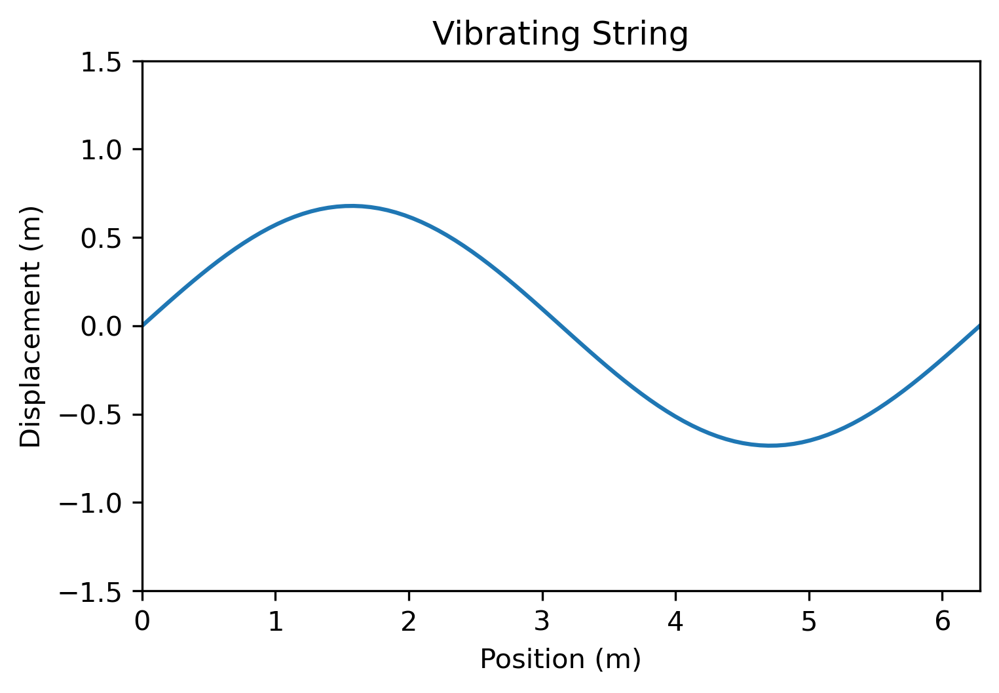

In [5]:
# Set up the plot
fig, ax = plt.subplots()
line, = ax.plot(x, y)
ax.set_ylim(-1.5, 1.5)
ax.set_xlim(0, L)
ax.set_title('Vibrating String')
ax.set_xlabel('Position (m)')
ax.set_ylabel('Displacement (m)')
# Animation function
skip = 2
def animate(frame):
    global y_old, y, y_new, skip
    for _ in range(skip):
      update_string(y_old, y)
    line.set_ydata(y)
    return line,
# Create animation
ani = FuncAnimation(fig, animate, frames=Nt, blit=True, interval=dt*1000*skip)
ani.save('../videos/standing_wave.mp4', writer='ffmpeg', fps=1/(dt*skip))
HTML(ani.to_jshtml())